In [ ]:
# Connectiong to google drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# importing libraries
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

In [4]:
print(tf.__version__)

2.11.0


In [5]:
!ls


drive  sample_data


In [7]:
# importing images using ImageDataGenerator

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the seed
tf.random.set_seed(42)

# Preprocess data (get all of the pixel values between 1 and 0, also called scaling/normalization)
train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Setup the train and test directories
train_dir = "/content/drive/MyDrive/images/train/"
val_dir = "/content/drive/MyDrive/images/validation/"
test_dir = "/content/drive/MyDrive/images/test/"

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32, # number of images to process at a time 
                                               target_size=(224, 224), # convert all images to be 224 x 224
                                               class_mode="input", # type of problem we're working on
                                               seed=42)

valid_data = valid_datagen.flow_from_directory(val_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="input",
                                               seed=42)

test_data = test_datagen.flow_from_directory(test_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="input",
                                               seed=42)

Found 417 images belonging to 1 classes.
Found 96 images belonging to 1 classes.
Found 64 images belonging to 1 classes.


In [8]:
# Creating the Auto-Encoder model

In [9]:

input_img = tf.keras.Input(shape=(224, 224, 3))

x =  tf.keras.layers.Conv2D(64, (3, 3), activation='selu', padding='same')(input_img)
#x = tf.keras.layers.BatchNormalization()(x)
x =  tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)
x =  tf.keras.layers.Conv2D(128, (3, 3), activation='selu', padding='same')(x)
#x = tf.keras.layers.BatchNormalization()(x)
encoded =  tf.keras.layers.MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x =  tf.keras.layers.Conv2D(128, (3, 3), activation='selu', padding='same')(encoded)
#x = tf.keras.layers.BatchNormalization()(x)
x =  tf.keras.layers.UpSampling2D((2, 2))(x)
x =  tf.keras.layers.Conv2D(64, (3, 3), activation='selu', padding ="same")(x)
#x = tf.keras.layers.BatchNormalization()(x)
x =  tf.keras.layers.UpSampling2D((2, 2))(x)
decoded =  tf.keras.layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

model =  tf.keras.Model(input_img, decoded)
model.compile(optimizer='adam', loss='binary_crossentropy')
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       147584

In [10]:

# Training the model

history1 = model.fit(train_data,
                epochs=10,
                validation_data= valid_data,
                shuffle=True)


Epoch 1/10
14/14 [==============================] - 192s 13s/step - loss: 0.4584 - val_loss: 0.2788
Epoch 2/10
14/14 [==============================] - 18s 1s/step - loss: 0.2862 - val_loss: 0.2570
Epoch 3/10
14/14 [==============================] - 25s 2s/step - loss: 0.2734 - val_loss: 0.2530
Epoch 4/10
14/14 [==============================] - 15s 1s/step - loss: 0.2702 - val_loss: 0.2511
Epoch 5/10
14/14 [==============================] - 18s 1s/step - loss: 0.2689 - val_loss: 0.2499
Epoch 6/10
14/14 [==============================] - 15s 1s/step - loss: 0.2682 - val_loss: 0.2494
Epoch 7/10
14/14 [==============================] - 15s 1s/step - loss: 0.2678 - val_loss: 0.2495
Epoch 8/10
14/14 [==============================] - 15s 1s/step - loss: 0.2677 - val_loss: 0.2489
Epoch 9/10
14/14 [==============================] - 18s 1s/step - loss: 0.2673 - val_loss: 0.2486
Epoch 10/10
14/14 [==============================] - 15s 1s/step - loss: 0.2679 - val_loss: 0.2535


In [ ]:
# decoded_imgs = model.predict(valid_data)
# encoder = tf.keras.Model(input_img, encoded)

3/3 [==============================] - 3s 1s/step


In [11]:
# Getting the image from intact bonds from imagedatagenerators and save them in a list
intact = []
temp = train_data.next()
for i in range (0, 32):
  intact.append(tf.expand_dims(temp[0][i], axis=0))


In [12]:
# re-generated intact images from autoencoder
intact_predicted = []
for pic in intact:
  intact_predicted.append(model.predict(pic))

1/1 [==============================] - 0s 29ms/step


In [13]:
# calculating Structural Similarity Index (SSIM) for re-generated images
intact_ssim = []
for i, pic in enumerate(intact):
  ssim2 = 1 - tf.image.ssim(pic, intact_predicted[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  intact_ssim.append(ssim2.numpy()[0])


In [14]:
intact_ssim [:10]

[0.07741982,
 0.07835078,
 0.07818037,
 0.07383841,
 0.073759794,
 0.06713563,
 0.067646444,
 0.08117002,
 0.07463813,
 0.08137697]

In [15]:
# the average error between original and re-generated images
sum(intact_ssim)/len(intact_ssim)

0.07509556598961353

In [16]:
max(intact_ssim)

0.08165091

<Figure size 1440x288 with 0 Axes>

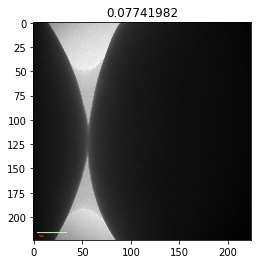

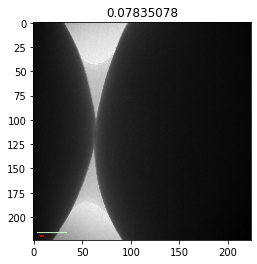

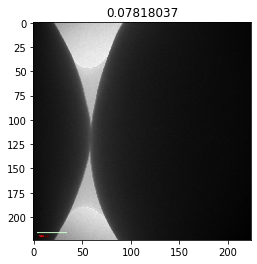

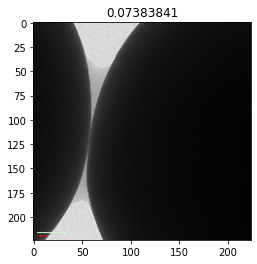

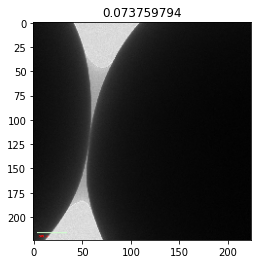

...

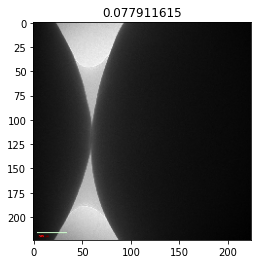

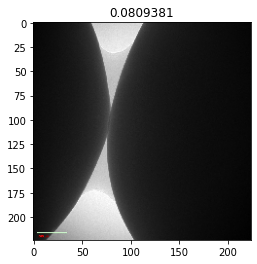

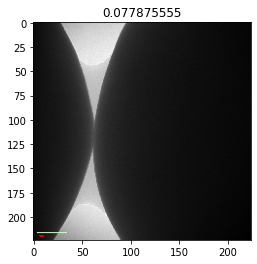

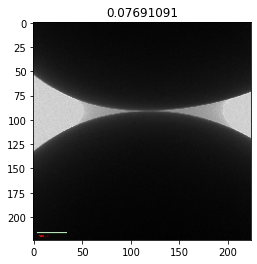

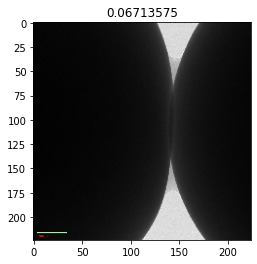

In [19]:
# plotting images and showing they generated SSIM error as the title
import cv2 as cv
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = intact[i].numpy()[0].shape[:2]
    res = cv.resize(intact[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(intact_ssim[i])
    plt.show()

In [24]:
# importing the first batch of broken bond images from test folder, he majority of test folder are from broken bonds, however there are several images from intact bonds to test the ability of the auto-encoder for detecting anomality.
broken = []
temp = test_data.next()
for i in range (0, 32):
  broken.append(tf.expand_dims(temp[0][i], axis=0))

In [25]:
#re-generating broken bond images using auto-encoder
broken_pred = []
for i in range (0, 32):
  pred = model.predict(broken[i])
  broken_pred.append(tf.expand_dims(pred, axis=0))

1/1 [==============================] - 0s 18ms/step


In [26]:
# calculating SSIM error for broken bond images
broken_ssim = []

for i, pic in enumerate(broken):
  ssim2 = 1 - tf.image.ssim(pic, broken_pred[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  #print(ssim2.numpy()[0][0])
  broken_ssim.append(ssim2.numpy()[0][0])

In [27]:
broken_ssim[:10]

[0.09340674,
 0.08059996,
 0.079518616,
 0.07828188,
 0.17704421,
 0.14392453,
 0.11228198,
 0.07856196,
 0.16370106,
 0.12345171]

<Figure size 1440x288 with 0 Axes>

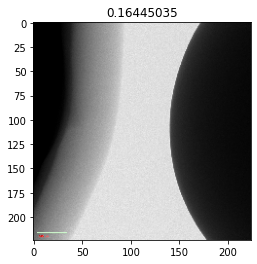

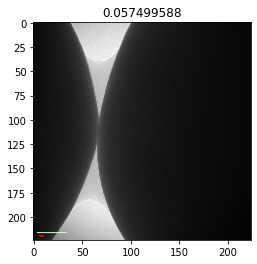

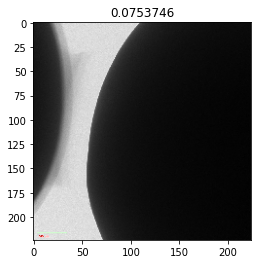

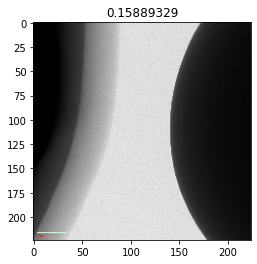

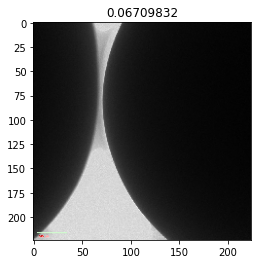

...

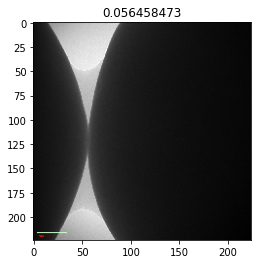

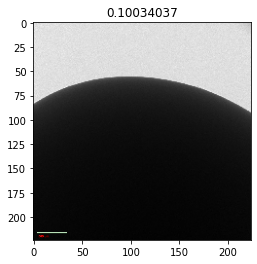

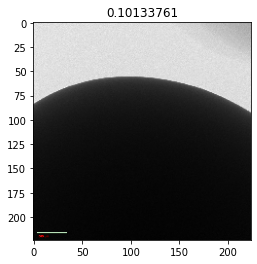

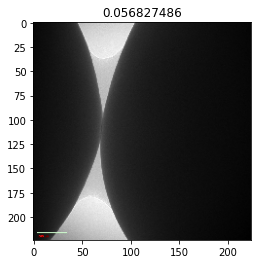

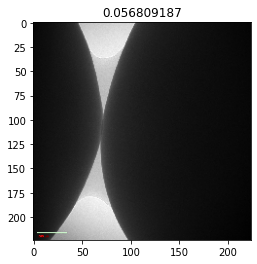

In [ ]:
# plotting images and showing they generated SSIM error as the title
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = broken[i].numpy()[0].shape[:2]
    res = cv.resize(broken[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(broken_ssim[i])
    plt.show()

In [20]:
# importing second batch broken bonds images from test folder
broken_2 = []
temp = test_data.next()[1]
for i in range (0,32):
  broken_2.append(tf.expand_dims(temp[i], axis=0))


In [21]:
# re-generating the broken bonds images from auto-encoder
broken_pred_2 = []
for i in range (0, 32):
  pred = model.predict(broken_2[i])
  broken_pred_2.append(tf.expand_dims(pred, axis=0))


1/1 [==============================] - 0s 20ms/step


In [22]:
# calculating Structural Similarity Index (SSIM) for re-generated images
broken_2_ssim = []

for i, pic in enumerate(broken_2):
  ssim2 = 1-tf.image.ssim(pic, broken_pred_2[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  #print(ssim2.numpy()[0][0])
  broken_2_ssim.append(ssim2.numpy()[0][0])

In [23]:
broken_2_ssim[:10]

[0.18454844,
 0.07944983,
 0.093645334,
 0.179138,
 0.08634049,
 0.12079698,
 0.09403092,
 0.14230317,
 0.07958764,
 0.06829864]

In [30]:
 broken_error = broken_ssim + broken_2_ssim
 sum(broken_error)/len(broken_error)
 print("for intact images the SSIM error average is: ", sum(intact_ssim)/len(intact_ssim), " and the average SSIM error for broken bond images is: ", sum(broken_error)/len(broken_error))

for intact images the SSIM error average is:  0.07509556598961353  and the average SSIM error for broken bond images is:  0.11419602949172258


In [ ]:
# do we can the error between 8 and 9 percent as the threshold for broken and intact particles.
#it means if the generated error exceeds 8 percent we can label that image as broken.

<Figure size 1440x288 with 0 Axes>

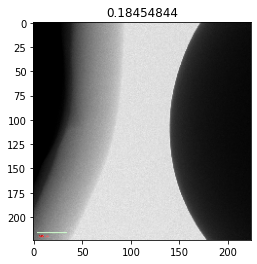

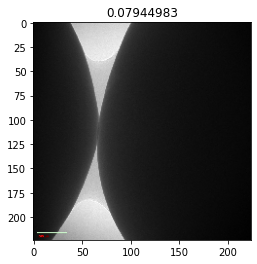

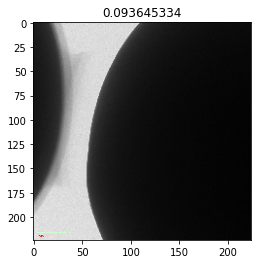

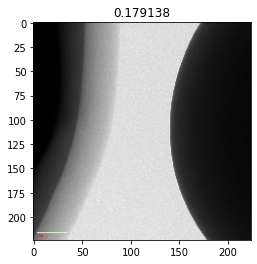

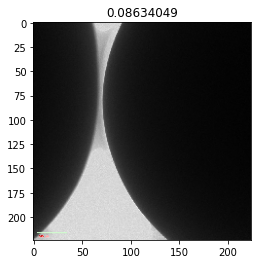

...

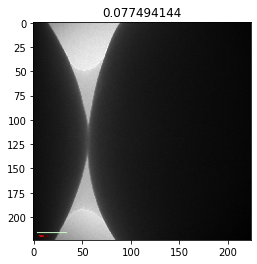

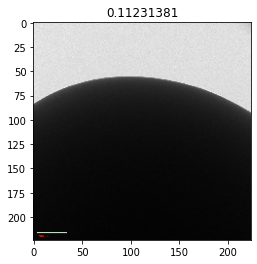

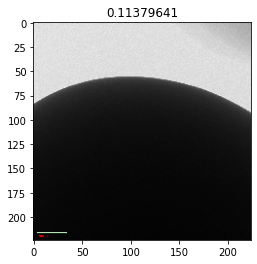

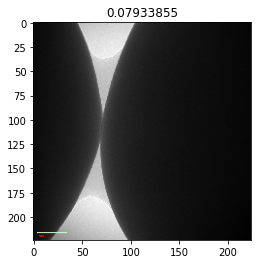

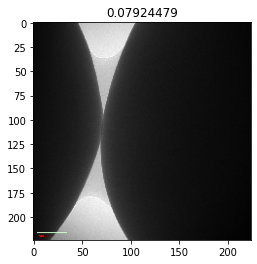

In [31]:
# plotting images and showing they generated SSIM error as the title, for second batch of broken bond generated images
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = broken_2[i].numpy()[0].shape[:2]
    res = cv.resize(broken_2[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(broken_2_ssim[i])
    plt.show()

In [ ]:
# IN THE SECOND STEP WE USE TRANSFER LEARNING INSIDE THE ENCODER SECTION TO SEE IF ANY IMPROVEMENTS HAPPEN...

In [32]:
resnet_url = "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4"
efficientnet_url = "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1"

In [33]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers

In [34]:
def create_model(model_url):
  
  # Download the pretrained model and save it as a Keras layer
  feature_extractor_layer = hub.KerasLayer(model_url,
                                           trainable=False, # freeze the underlying patterns
                                           name='feature_extraction_layer',
                                           input_shape=(224,224,3)) # define the input image shape
  
  # Create our own model
  encoder = tf.keras.Sequential([
    feature_extractor_layer, # use the feature extraction layer as the base
    tf.keras.layers.Dense(3136, activation='sigmoid', name='output_layer') # create our own output layer      
  ])
  decoder = tf.keras.Sequential([
      tf.keras.layers.Input(shape=(3136)),
      tf.keras.layers.Dense(units=3136,activation='sigmoid'),
      tf.keras.layers.Reshape((28,28,4)),
      tf.keras.layers.Conv2DTranspose(4,kernel_size=3,activation='relu',padding='same',strides=2),
      #tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2DTranspose(8,kernel_size=3,strides=2,activation='relu',padding='same'),
      #tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2DTranspose(16,kernel_size=3,strides=2,activation='relu',padding='same'),
      #tf.keras.layers.UpSampling2D((2, 2)),
      tf.keras.layers.Conv2D(3,kernel_size=(3,3),activation='sigmoid',padding='same')])
  
  resnet_model = tf.keras.models.Sequential([encoder, decoder])
  return resnet_model

In [35]:
resnet_model = create_model(resnet_url)
resnet_model.summary()

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 3136)              29990464  
                                                                 
 sequential_1 (Sequential)   (None, 224, 224, 3)       9839679   
                                                                 
Total params: 39,830,143
Trainable params: 16,265,343
Non-trainable params: 23,564,800
_________________________________________________________________


In [36]:
resnet_model.compile(loss='binary_crossentropy',
                     optimizer=tf.keras.optimizers.Adam())

In [37]:
resnet_model.fit(train_data,
                epochs=10,
                validation_data= valid_data,
                shuffle=True)

Epoch 1/10
14/14 [==============================] - 25s 1s/step - loss: 0.6640 - val_loss: 0.6235
Epoch 2/10
14/14 [==============================] - 16s 1s/step - loss: 0.5802 - val_loss: 0.5025
Epoch 3/10
14/14 [==============================] - 14s 996ms/step - loss: 0.4607 - val_loss: 0.3967
Epoch 4/10
14/14 [==============================] - 14s 1s/step - loss: 0.4245 - val_loss: 0.3891
Epoch 5/10
14/14 [==============================] - 14s 1s/step - loss: 0.4148 - val_loss: 0.3902
Epoch 6/10
14/14 [==============================] - 14s 1s/step - loss: 0.4119 - val_loss: 0.3841
Epoch 7/10
14/14 [==============================] - 14s 1s/step - loss: 0.4096 - val_loss: 0.3834
Epoch 8/10
14/14 [==============================] - 14s 1s/step - loss: 0.4077 - val_loss: 0.3824
Epoch 9/10
14/14 [==============================] - 14s 1s/step - loss: 0.4060 - val_loss: 0.3808
Epoch 10/10
14/14 [==============================] - 14s 999ms/step - loss: 0.4043 - val_loss: 0.3806


In [38]:
intact = []
temp = train_data.next()
for i in range (0, 32):
  intact.append(tf.expand_dims(temp[0][i], axis=0))

In [39]:
intact_predicted = []
for pic in intact:
  intact_predicted.append(resnet_model.predict(pic))

1/1 [==============================] - 0s 25ms/step


In [40]:
intact_ssim = []

for i, pic in enumerate(intact):
  ssim2 = 1 - tf.image.ssim(pic, intact_predicted[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  intact_ssim.append(ssim2.numpy()[0])


In [41]:
intact_ssim

[0.47042567,
 0.47117358,
 0.5748327,
 0.5868615,
 0.48749346,
 0.58712006,
 0.57239723,
 0.47552687,
 0.57705486,
 0.5746635,
 0.5754539,
 0.5755646,
 0.47143346,
 0.57169104,
 0.48683685,
 0.55973685,
 0.5744914,
 0.55939484,
 0.5865271,
 0.5769298,
 0.57202065,
 0.47816128,
 0.47203165,
 0.47216517,
 0.5719061,
 0.5600356,
 0.57649016,
 0.48760104,
 0.48821062,
 0.48775965,
 0.5750948,
 0.4723261]

In [52]:
print("min ssim: ", min(intact_ssim), "max ssim: ",max(intact_ssim),"avg ssim: ", sum(intact_ssim)/len(intact_ssim))

min ssim:  0.47042567 max ssim:  0.58712006 avg ssim:  0.5352941267192364


In [ ]:
# the avverage ssim reduced from the previous model which was: 0.07509556598961353

<Figure size 1440x288 with 0 Axes>

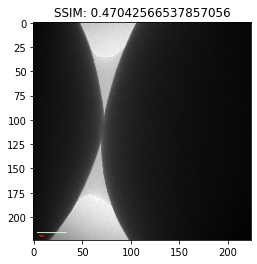

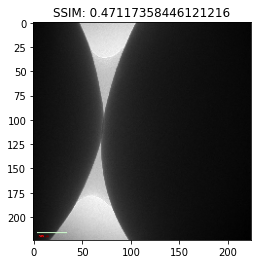

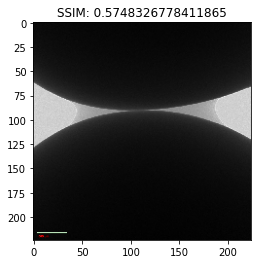

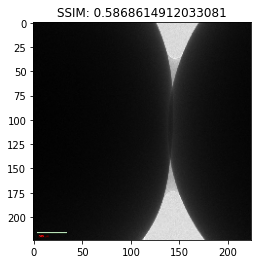

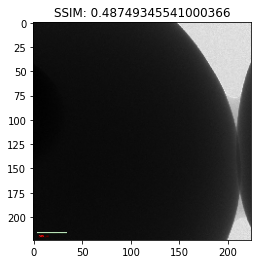

...

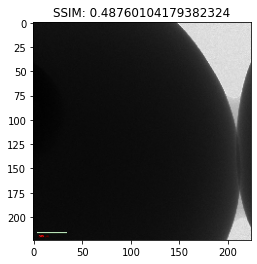

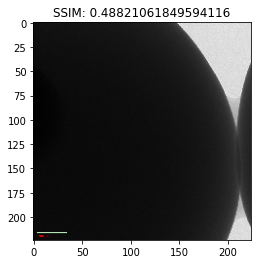

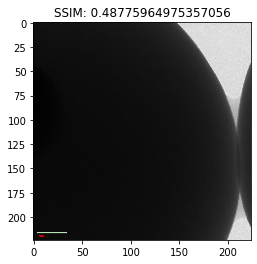

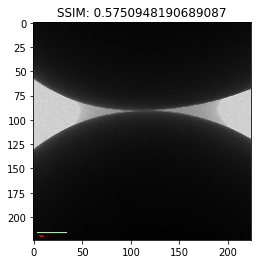

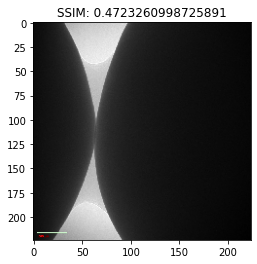

In [45]:
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = intact[i].numpy()[0].shape[:2]
    res = cv.resize(intact[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(f"SSIM: {intact_ssim[i]}")
    plt.show()

In [46]:
broken = []
temp = test_data.next()
for i in range (0, 32):
  broken.append(tf.expand_dims(temp[0][i], axis=0))

In [47]:
broken_pred = []
for i in range (0, 32):
  pred = model.predict(broken[i])
  broken_pred.append(tf.expand_dims(pred, axis=0))

1/1 [==============================] - 0s 35ms/step


In [48]:
broken_ssim = []

for i, pic in enumerate(broken):
  ssim2 = 1 - tf.image.ssim(pic, broken_pred[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  #print(ssim2.numpy()[0][0])
  broken_ssim.append(ssim2.numpy()[0][0])

In [49]:
broken_ssim

[0.18765146,
 0.08676928,
 0.093645334,
 0.18019277,
 0.08634049,
 0.07828188,
 0.09464127,
 0.18157691,
 0.08057493,
 0.09242463,
 0.07924479,
 0.08648729,
 0.09340674,
 0.14461964,
 0.14392453,
 0.092425406,
 0.14230317,
 0.14541024,
 0.08059996,
 0.18224716,
 0.18454844,
 0.11379641,
 0.07754779,
 0.12345171,
 0.09403092,
 0.11148757,
 0.079518616,
 0.17412287,
 0.17704421,
 0.17008662,
 0.112558186,
 0.1358614]

In [51]:
print("min ssim: ",min(broken_ssim), "max ssim: ",max(broken_ssim),"avg ssim: ", sum(broken_ssim)/len(broken_ssim))

min ssim:  0.07754779 max ssim:  0.18765146 avg ssim:  0.12208820693194866


<Figure size 1440x288 with 0 Axes>

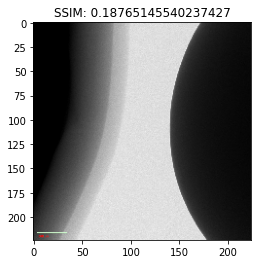

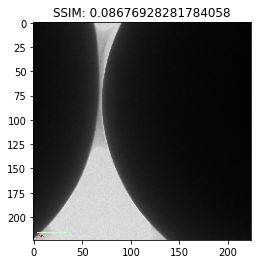

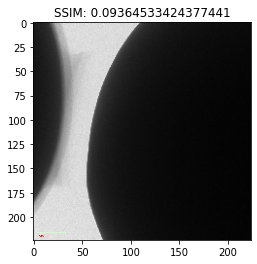

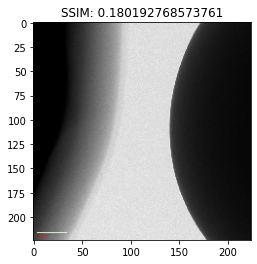

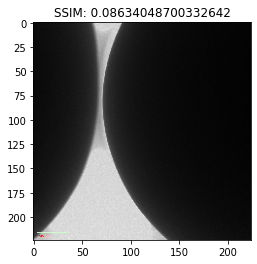

...

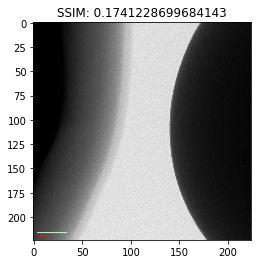

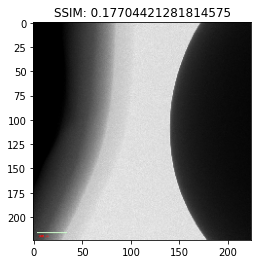

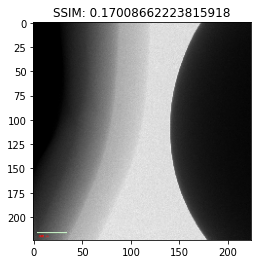

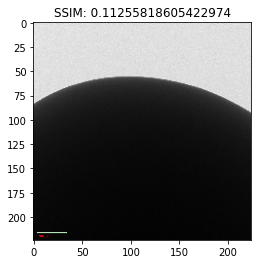

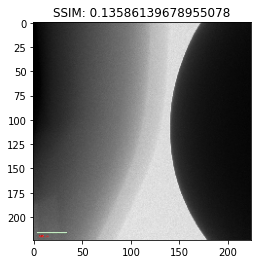

In [53]:
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = broken[i].numpy()[0].shape[:2]
    res = cv.resize(broken[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(f"SSIM: {broken_ssim[i]}")
    plt.show()

In [54]:
broken_2 = []
temp = test_data.next()[1]
for i in range (0, 32):
  broken_2.append(tf.expand_dims(temp[i], axis=0))

In [55]:
broken_pred_2 = []
for i in range (0, 32):
  pred = model.predict(broken_2[i])
  broken_pred_2.append(tf.expand_dims(pred, axis=0))

1/1 [==============================] - 0s 27ms/step


In [56]:
broken_2_ssim = []

for i, pic in enumerate(broken_2):
  ssim2 = 1-tf.image.ssim(pic, broken_pred_2[i], max_val=1.0, filter_size=11,
                          filter_sigma=1.5, k1=0.01, k2=0.03)
  #print(ssim2.numpy()[0][0])
  broken_2_ssim.append(ssim2.numpy()[0][0])

In [57]:
broken_2_ssim

[0.08700961,
 0.09050393,
 0.11231381,
 0.14319229,
 0.07856196,
 0.08922815,
 0.08921927,
 0.07980865,
 0.179138,
 0.12351513,
 0.09264946,
 0.0926559,
 0.12079698,
 0.121527374,
 0.08126855,
 0.06829864,
 0.08707756,
 0.077494144,
 0.07958764,
 0.08995825,
 0.089895666,
 0.16695315,
 0.16812915,
 0.07944983,
 0.081150055,
 0.11228198,
 0.093076766,
 0.07933855,
 0.16370106,
 0.1725927,
 0.12186527,
 0.0894838]

<Figure size 1440x288 with 0 Axes>

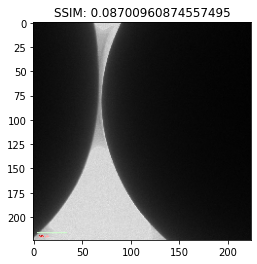

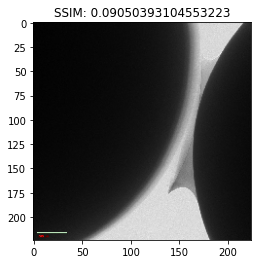

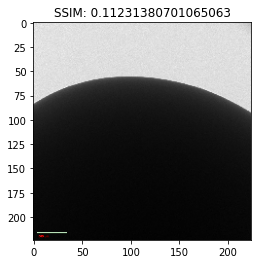

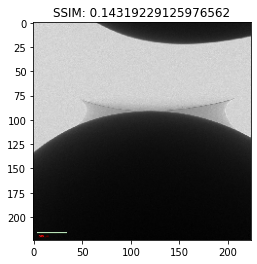

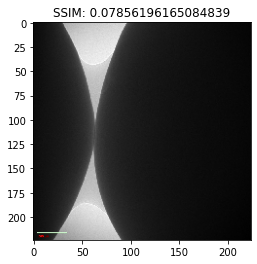

...

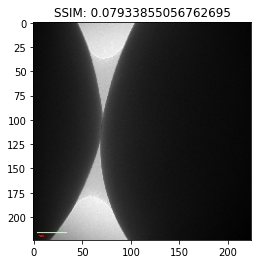

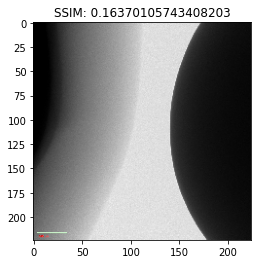

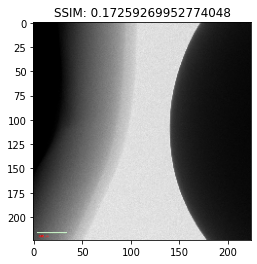

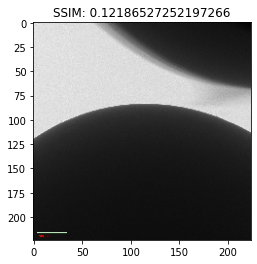

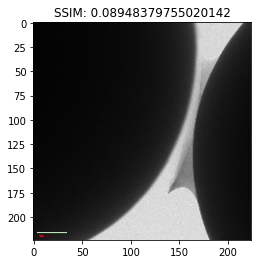

In [58]:
n = 32
plt.figure(figsize=(20, 4))
for i in range(0, n):
    
    plt.figure(figsize=(20, 4)) 
    height, width = broken_2[i].numpy()[0].shape[:2]
    res = cv.resize(broken_2[i].numpy()[0],(224,224))
    plt.imshow(res)
    plt.title(f"SSIM: {broken_2_ssim[i]}")
    plt.show()

In [ ]:
# by chosing SSIM as 0.085 as the threshold, only 5 images are being labeled wrong.